# Gradient descent 

Gradient descent is a way to minimize an objective function J(θ)
 parameterized by a model's parameters θ ∈ R d by updating the parameters in the opposite direction of the gradient of the objective function 
∇
θ
J
(
θ
)
 w.r.t. to the parameters. The learning rate 
η
 determines the size of the steps we take to reach a (local) minimum.

# Batch gradient descent

Computes the gradient of the cost function w.r.t. to the parameters 
θ
 for the entire training dataset

$θ = θ − η ⋅∇θ J(θ)$

# Stochastic gradient descent

Stochastic gradient descent (SGD) in contrast performs a parameter update for each training example 
x
(
i
)
 and label 
y
(
i
)
:

$θ
=
θ
−
η
⋅
∇
θ
J
(
θ
;
x^
i
;
y^i
)$


# Mini-batch gradient descent


Mini-batch gradient descent finally takes the best of both worlds and performs an update for every mini-batch of 
n
 training examples

$ θ
=
θ
−
η
⋅
∇
θ
J
(
θ
;
x
(
i
:
i
+
n
)
;
y
(
i
:
i
+
n
)$


# Gradient descent optimization algorithms

# Momentum


Momentum  is a method that helps accelerate SGD in the relevant direction and dampens oscillations
It does this by adding a fraction 
γ
 of the update vector of the past time step to the current update vector

$vt
=
γ*
{v_{t−1}}
+
η
∇
θ
J
(
θ
)\\
θ
=
θ
−
{vt}$

Some implementations exchange the signs in the equations. The momentum term 
γ
 is usually set to 0.9 or a similar value

# Nesterov accelerated gradient


 Nesterov accelerated gradient (NAG) is a way to give our momentum term this kind of prescience

$v
t
=
γ*
v_{
t
−
1}
+
η
∇
θ
J
(
θ
−
γ
_{v
t
−
1}
)
\\
θ
=
θ
−
v
t
$

# Adagrad

It adapts the learning rate to the parameters, performing smaller updates
(i.e. low learning rates) for parameters associated with frequently occurring features, and larger updates (i.e. high learning rates) for parameters associated with infrequent features.

$θ_{
t
+
1
,
i}
=
θ_{
t
,
i}
−
\frac{n}{
\sqrt{
G_{
t
,
i
i}
+
ϵ}}
⋅
g
t
,
i$

$G
t
∈
R
^{d
×
d}$
 here is a diagonal matrix where each diagonal element 
i
,
i
 is the sum of the squares of the gradients 

# Adadelta

Adadelta is an extension of Adagrad that seeks to reduce its aggressive, monotonically decreasing learning rate. Instead of accumulating all past squared gradients

$Δ
θ
t
=
−\frac{
R
M
S
[
Δ
θ
]
t
−
1}{
R
M
S
[
g
]
t}
g
t\\
θ
t
+
1
=
θ
t
+
Δ
θ
t$

With Adadelta, we do not even need to set a default learning rate, as it has been eliminated from the update rule.

# RMSprop

RMSprop as well divides the learning rate by an exponentially decaying average of squared gradients. Hinton suggests 
γ
 to be set to 0.9, while a good default value for the learning rate 
η
 is 0.001.

$E
[
g
^2
]
t
=
0.9
E
[
g^
2
]_{
t
−
1}
+
0.1
g^
2
t\\
θ
t
+
1
=
θ
t
−\frac{
η}{
\sqrt{
E
[
g
2
]
t
+
ϵ}}
g
t$

# Adam

Adaptive Moment Estimation (Adam) is another method that computes adaptive learning rates for each parameter. In addition to storing an exponentially decaying average of past squared gradients $
v
t$
 like Adadelta and RMSprop, Adam also keeps an exponentially decaying average of past gradients $m t $


$m
t
=
β
1
m_{
t
−
1}
+
(
1
−
β
1
)
g
t\\
v
t
=
β_
2
v_{
t
−
1}
+
(
1
−
β_
2
)
g
t^2$

$\hat{m}
t
=\frac{
m
t}{
1
−
β^
t
1}
\\
\hat{v}
t
=
\frac{v
t}{
1
−
β
^t
2}
$

$θ_{
t
+
1}
=
θ
t
−\frac{
η}{
\sqrt{
\hat{
v}}
t
+
ϵ}
\hat{
m}
$

default values of 0.9 for 
β
1
, 0.999 for 
β
2
, and 
10
−
8
 for 
ϵ
. 

# AdaMax

ℓ
∞
 also generally exhibits stable behavior. For this reason, the authors propose AdaMax (Kingma and Ba, 2015) and show that 
v
t
 with 
ℓ
∞
 converges to the following more stable value.

$u
t
=
β^
∞
2
v
t
−
1
+
(
1
−
β^
∞
2
)
|
g
t
|^
∞
\\=
max
(
β
2
⋅
v
t
−
1
,
|
g
t
|
)$


$θ
t
+
1
=
θ
t
−\frac{
η}{
u
t}
\hat{
m}
t$

Good default values are again 
η
=
0.002
, 
β
1
=
0.9
, and 
β
2
=
0.999
.

# Nadam

Nadam (Nesterov-accelerated Adaptive Moment Estimation) thus combines Adam and NAG

$θ
t
+
1
=
θ
t
−\frac{
η}{
\sqrt{
\hat{
v}
t}
+
ϵ}
(
β
1
\hat{
m}
t
+\frac{
(
1
−
β
1
)
g
t}{
1
−
β^
t
1}
)$

# AMSGrad

AMSGrad that uses the maximum of past squared gradients 
v
t
 rather than the exponential average to update the parameters

$m
t
=
β
1
m
t
−
1
+
(
1
−
β
1
)
g
t$

$v
t
=
β
2
v
t
−
1
+
(
1
−
β
2
)
g
2
t$

$\hat
v
t
=
max
(
\hat
v_{
t
−
1}
,
v
t
)$

$θ_{
t
+
1}
=
θ
t
−\frac{
η}{
\sqrt{
\hat
v
t}
}
m
t$

![alt text](perfomance.png "Title")

In [99]:
class GD_optimizer:
    
    def __init__(self, f, x_init, y_init, optimizer='GD', alpha=0.01, gamma=0.9, eps=1e-8, beta=0.9, beta1=0.9, 
                 rho = 0.8, beta2=0.99):
        self.x = x_init
        self.y = y_init
        self.v_x = 0
        self.v_y = 0
        self.m_x = 0
        self.m_y = 0
        self.num_updates = 0
        self.x_h = []
        self.y_h = []
        self.e_h = []
        self.f = f
        self.alpha = alpha
        self.gamma = gamma
        self.eps = eps
        self.beta = beta
        self.beta1 = beta1
        self.beta2 = beta2
        self.rho = rho
        self.delta_x = 0
        self.delta_y = 0
        self.amsgrad_v_x_c = 0
        self.amsgrad_v_y_c = 0
        self.optimizer = optimizer
        nmodels= "gd","momentum", "nag", "adagrad", "rmspro", "adam","adadelta", "adamax", "nadam", "amsgrad"
        self.models = {
            nmodels[0]: self.gd,
            nmodels[1]: self.momentum,
            nmodels[2]: self.nag,
            nmodels[3]: self.adagrad,
            nmodels[4]: self.rmspro,
            nmodels[5]: self.adam,
            nmodels[6]: self.adadelta,
            nmodels[7]: self.adamax,
            nmodels[8]: self.nadam,
            nmodels[9]: self.amsgrad
        } 
        
    def gd(self):
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)
        # update x and y
        self.x = self.x - self.alpha*dz_dx
        self.y = self.y - self.alpha*dz_dy
    
    def momentum(self):
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)
        self.v_x = self.gamma * self.v_x + self.alpha * dz_dx 
        self.v_y = self.gamma * self.v_y + self.alpha * dz_dy
        self.x = self.x - self.v_x  
        self.y = self.y - self.v_y 
        
    def adagrad(self):
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)
        self.v_x += dz_dx**2
        self.v_y += dz_dy**2
        self.x -= (self.alpha / (np.sqrt(self.v_x + self.eps))) * dz_dx
        self.y -= (self.alpha / (np.sqrt(self.v_y + self.eps))) * dz_dy      
        
    def rmspro(self):
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)
        self.v_x = self.beta * self.v_x + (1 - self.beta) * dz_dx**2
        self.v_y = self.beta * self.v_y + (1 - self.beta) * dz_dy**2
        self.x -= (self.alpha / np.sqrt(self.v_x) + self.eps) * dz_dx
        self.y -= (self.alpha / np.sqrt(self.v_y) + self.eps) * dz_dy
        
    def adadelta(self):
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)
        
        self.v_x = self.rho * self.v_x + (1. - self.rho) * dz_dx**2
        
        self.v_y = self.rho * self.v_y + (1. - self.rho) * dz_dy**2
        
        cur_delta_x = ((np.sqrt(self.delta_x + self.eps)) / (np.sqrt(self.v_x + self.eps))) * dz_dx
        
        cur_delta_y = ((np.sqrt(self.delta_y + self.eps)) / (np.sqrt(self.v_y + self.eps))) * dz_dy
        
        self.delta_x = self.rho * self.delta_x + (1. - self.rho) * cur_delta_x * cur_delta_x
        
        self.delta_y = self.rho * self.delta_y + (1. - self.rho) * cur_delta_y * cur_delta_y
        
        self.x -= cur_delta_x 
        
        self.y -= cur_delta_y  
        
    def nag (self):
        self.v_x = self.gamma * self.v_x
        self.v_y = self.gamma * self.v_y
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x - self.v_x, self.y - self.v_y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x - self.v_x, self.y - self.v_y)
        self.v_x = self.v_x + self.alpha * dz_dx
        self.v_y = self.v_y + self.alpha * dz_dy
        self.x = self.x - self.v_x  
        self.y = self.y - self.v_y 
          
    def adam(self):
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)
        self.num_updates += 1
        
        self.m_x = self.beta1 * self.m_x + (1-self.beta1) * dz_dx
        self.m_y = self.beta1 * self.m_y + (1-self.beta1) * dz_dy
        
        self.v_x = self.beta2 * self.v_x + (1-self.beta2) * dz_dx**2
        self.v_y = self.beta2 * self.v_y + (1-self.beta2) * dz_dy**2
        
        m_x_c = self.m_x / (1 - np.power(self.beta1, self.num_updates))
        m_y_c = self.m_y / (1 - np.power(self.beta1, self.num_updates))
        
        v_x_c = self.v_x / (1 - np.power(self.beta2, self.num_updates))
        v_y_c = self.v_y / (1 - np.power(self.beta2, self.num_updates))
        
        
        self.x -= (self.alpha / (np.sqrt(v_x_c) + self.eps)) * m_x_c
        self.y -= (self.alpha / (np.sqrt(v_y_c) + self.eps)) * m_y_c
        
    def adamax(self):
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)
        self.num_updates += 1
        
        self.m_x = self.beta1 * self.m_x + (1-self.beta1) * dz_dx
        self.m_y = self.beta1 * self.m_y + (1-self.beta1) * dz_dy
        
        self.v_x = np.maximum(self.beta2 * self.v_x , abs(dz_dx))
        self.v_y = np.maximum(self.beta2 * self.v_y , abs(dz_dy))
        
        m_x_c = self.m_x / (1 - np.power(self.beta1, self.num_updates))
        m_y_c = self.m_y / (1 - np.power(self.beta1, self.num_updates))
        
        self.x -= (self.alpha / (self.v_x)) * m_x_c
        self.y -= (self.alpha / (self.v_y)) * m_y_c
        
    def nadam(self):  
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)
        self.num_updates += 1
        
        self.m_x = self.beta1 * self.m_x + (1-self.beta1) * dz_dx
        self.m_y = self.beta1 * self.m_y + (1-self.beta1) * dz_dy
        
        self.v_x = self.beta2 * self.v_x + (1-self.beta2) * dz_dx**2
        self.v_y = self.beta2 * self.v_y + (1-self.beta2) * dz_dy**2
        
        beta1_sum = (1 - np.power(self.beta1, self.num_updates))
        
        m_x_c = self.m_x / beta1_sum
        m_y_c = self.m_y / beta1_sum
        
        v_x_c = self.v_x / (1 - np.power(self.beta2, self.num_updates))
        v_y_c = self.v_y / (1 - np.power(self.beta2, self.num_updates))
        
        self.x -= (self.alpha / (np.sqrt(v_x_c) + self.eps)) * (self.beta1 * m_x_c + (((1- self.beta1)*dz_dx)/ beta1_sum))
        self.y -= (self.alpha / (np.sqrt(v_y_c) + self.eps)) * (self.beta1 * m_y_c + (((1- self.beta1)*dz_dy)/ beta1_sum))
   
    def amsgrad(self):
        dz_dx = elementwise_grad(self.f, argnum=0)(self.x, self.y)
        dz_dy = elementwise_grad(self.f, argnum=1)(self.x, self.y)

        self.m_x = self.beta1 * self.m_x + (1-self.beta1) * dz_dx
        self.m_y = self.beta1 * self.m_y + (1-self.beta1) * dz_dy
        
        self.v_x = self.beta2 * self.v_x + (1-self.beta2) * dz_dx**2
        self.v_y = self.beta2 * self.v_y + (1-self.beta2) * dz_dy**2
        
        self.amsgrad_v_x_c = np.maximum(self.amsgrad_v_x_c, self.v_x)
        self.amsgrad_v_y_c = np.maximum(self.amsgrad_v_y_c, self.v_y)
        
        self.x -= (self.alpha / (np.sqrt(self.amsgrad_v_x_c) + self.eps)) * self.m_x
        self.y -= (self.alpha / (np.sqrt(self.amsgrad_v_y_c) + self.eps)) * self.m_y
        
    def fit(self, precision, epochs, verbose=0 ):
        path_ = []
        path_.append([self.x, self.y])
        for e in range(epochs):
            self.models[self.optimizer]()
            # log the progress
            if e % (epochs/10) == 0:
                path_.append([self.x, self.y])
                if self.f(self.x, self.y) == self.f(self.x, self.y):
                    if verbose == 1 :
                        print("epoch:", e, "derivate: ", self.f(self.x, self.y)) 
                else :
                    print("Error") 
                    break
            if( abs(self.f(self.x, self. y))  < precision):
                break
            path = np.array(path_).T
        print(self.f(self.x, self. y))
        return self.x, self.y, e, path

In [100]:
%matplotlib inline

In [101]:
import matplotlib.pyplot as plt
import numpy as np

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LogNorm


!pip install autograd
from autograd import elementwise_grad, value_and_grad
from collections import defaultdict
from itertools import zip_longest
from matplotlib import animation
from IPython.display import HTML
from random import randrange

You should consider upgrading via the 'pip install --upgrade pip' command.


Beale's Function
\begin{equation*}
f(x,y)=(1.5−x+xy)^2+(2.25−x+xy^2)^2+(2.625−x+xy^3)^2
\end{equation*}

In [102]:
f  = lambda x, y: (1.5 - x + x*y)**2 + (2.25 - x + x*y**2)**2 + (2.625 - x + x*y**3)**2

In [103]:
xmin, xmax, xstep = -4.5, 4.5, .2
ymin, ymax, ystep = -4.5, 4.5, .2

In [104]:
x, y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))

In [105]:
z = f(x, y)

Global minima is at  (3,0.5)

In [106]:
minima = np.array([3., .5])

In [107]:
f(*minima)

0.0

In [108]:
minima_ = minima.reshape(-1, 1)
minima_

array([[3. ],
       [0.5]])

In [109]:
f(*minima_)


array([0.])

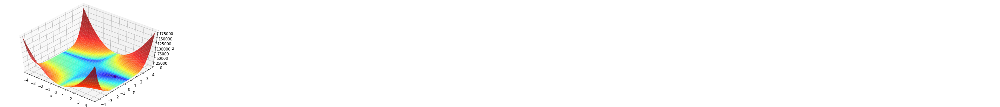

In [110]:
fig = plt.figure(figsize=(8, 5))
ax = plt.axes(projection='3d', elev=50, azim=-50)

ax.plot_surface(x, y, z, norm=LogNorm(), rstride=1, cstride=1, 
                edgecolor='none', alpha=.8, cmap=plt.cm.jet)
ax.plot(*minima_, f(*minima_), 'r*', markersize=10)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')

ax.set_xlim((xmin, xmax))
ax.set_ylim((ymin, ymax))

plt.show()

In [111]:
dz_dx = elementwise_grad(f, argnum=0)(x, y)
dz_dy = elementwise_grad(f, argnum=1)(x, y)

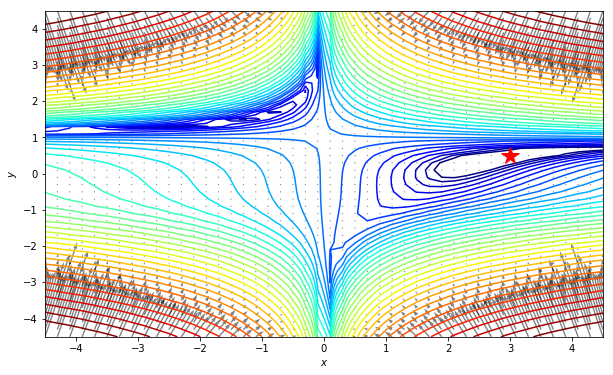

In [112]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.contour(x, y, z, levels=np.logspace(0, 5, 35), norm=LogNorm(), cmap=plt.cm.jet)
ax.quiver(x, y, x - dz_dx, y - dz_dy, alpha=.5)
ax.plot(*minima_, 'r*', markersize=18)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')

ax.set_xlim((xmin, xmax))
ax.set_ylim((ymin, ymax))

plt.show()

In [113]:
#x0 = [randrange(-400,400,1)/100.0, randrange(-400,400,1)/100.0]
x0 = [-3.4, 2.2]
gd = GD_optimizer(f, x0[0],  x0[1], optimizer = 'gd', alpha=0.001)
x_0, y_0, e, path  = gd.fit(precision=0.001, epochs=1000)
print ("Minimum: " + str(f(x_0,y_0)) + " at (" + str(x_0) + "," + str(y_0) + ")")

0.14032380460490443
Minimum: 0.14032380460490443 at (2.364195041647178,0.2906613376981097)


(-4.5, 4.5)

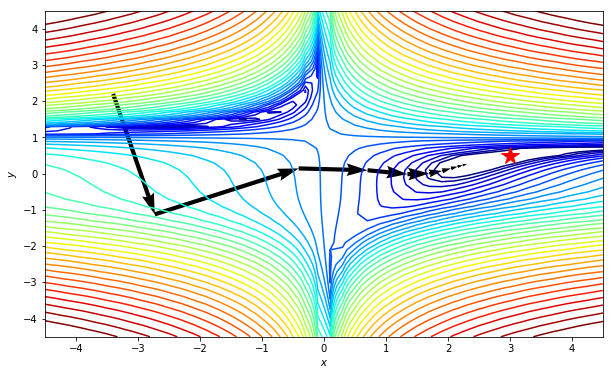

In [114]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.contour(x, y, z, levels=np.logspace(0, 5, 35), norm=LogNorm(), cmap=plt.cm.jet)
ax.quiver(path[0,:-1], path[1,:-1], path[0,1:]-path[0,:-1], path[1,1:]-path[1,:-1], scale_units='xy', angles='xy', scale=1, color='k')

ax.plot(*minima_, 'r*', markersize=18)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')

ax.set_xlim((xmin, xmax))
ax.set_ylim((ymin, ymax))

(-4.5, 4.5)

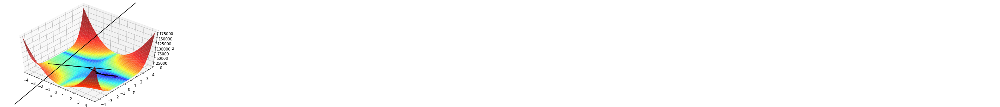

In [115]:
fig = plt.figure(figsize=(8, 5))
ax = plt.axes(projection='3d', elev=50, azim=-50)

ax.plot_surface(x, y, z, norm=LogNorm(), rstride=1, cstride=1, edgecolor='none', alpha=.8, cmap=plt.cm.jet)
ax.quiver(path[0,:-1], path[1,:-1], f(*path[::,:-1]), 
          path[0,1:]-path[0,:-1], path[1,1:]-path[1,:-1], f(*(path[::,1:]-path[::,:-1])), 
          color='k')
ax.plot(*minima_, f(*minima_), 'r*', markersize=10)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')

ax.set_xlim((xmin, xmax))
ax.set_ylim((ymin, ymax))

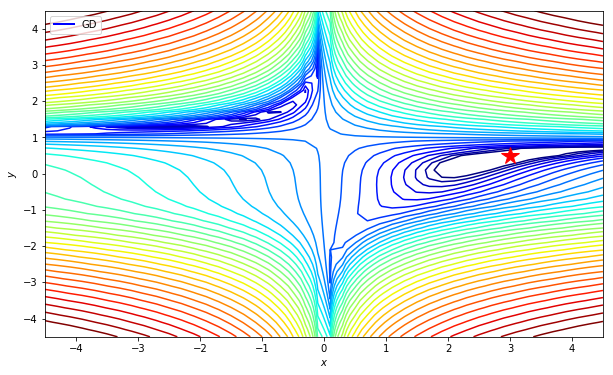

In [116]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.contour(x, y, z, levels=np.logspace(0, 5, 35), norm=LogNorm(), cmap=plt.cm.jet)
ax.plot(*minima_, 'r*', markersize=18)

line, = ax.plot([], [], 'b', label='GD', lw=2)
point, = ax.plot([], [], 'bo')

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')

ax.set_xlim((xmin, xmax))
ax.set_ylim((ymin, ymax))

ax.legend(loc='upper left')

In [117]:
def init():
    line.set_data([], [])
    point.set_data([], [])
    return line, point

In [118]:
def animate(i):
    line.set_data(*path[::,:i])
    point.set_data(*path[::,i-1:i])
    return line, point

In [119]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=path.shape[1], interval=200, 
                               repeat_delay=5, blit=True)

In [120]:
HTML(anim.to_jshtml())

(-4.5, 4.5)

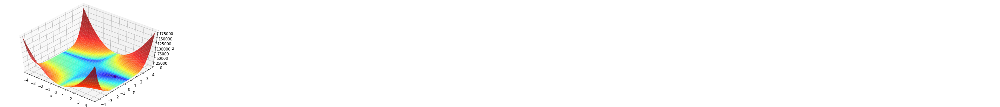

In [121]:
fig = plt.figure(figsize=(8, 5))
ax = plt.axes(projection='3d', elev=50, azim=-50)

ax.plot_surface(x, y, z, norm=LogNorm(), rstride=1, cstride=1, edgecolor='none', alpha=.8, cmap=plt.cm.jet)
ax.plot(*minima_, f(*minima_), 'r*', markersize=10)

line, = ax.plot([], [], [], 'b', label='GD', lw=2)
point, = ax.plot([], [], [], 'bo')

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')

ax.set_xlim((xmin, xmax))
ax.set_ylim((ymin, ymax))

In [122]:
def init():
    line.set_data([], [])
    line.set_3d_properties([])
    point.set_data([], [])
    point.set_3d_properties([])
    return line, point

In [123]:
def animate(i):
    line.set_data(path[0,:i], path[1,:i])
    line.set_3d_properties(f(*path[::,:i]))
    point.set_data(path[0,i-1:i], path[1,i-1:i])
    point.set_3d_properties(f(*path[::,i-1:i]))
    return line, point

In [124]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=path.shape[1], interval=200, 
                               repeat_delay=5, blit=True)

In [125]:
HTML(anim.to_jshtml())

In [126]:
class TrajectoryAnimation(animation.FuncAnimation):
    
    def __init__(self, *paths, labels=[], fig=None, ax=None, frames=None, 
                 interval=300, repeat_delay=5, blit=True, **kwargs):

        if fig is None:
            if ax is None:
                fig, ax = plt.subplots()
            else:
                fig = ax.get_figure()
        else:
            if ax is None:
                ax = fig.gca()

        self.fig = fig
        self.ax = ax
        
        self.paths = paths

        if frames is None:
            frames = max(path.shape[1] for path in paths)
  
        self.lines = [ax.plot([], [], label=label, lw=2)[0] 
                      for _, label in zip_longest(paths, labels)]
        self.points = [ax.plot([], [], 'o', color=line.get_color())[0] 
                       for line in self.lines]

        super(TrajectoryAnimation, self).__init__(fig, self.animate, init_func=self.init_anim,
                                                  frames=frames, interval=interval, blit=blit,
                                                  repeat_delay=repeat_delay, **kwargs)

    def init_anim(self):
        for line, point in zip(self.lines, self.points):
            line.set_data([], [])
            point.set_data([], [])
        return self.lines + self.points

    def animate(self, i):
        for line, point, path in zip(self.lines, self.points, self.paths):
            line.set_data(*path[::,:i])
            point.set_data(*path[::,i-1:i])
        return self.lines + self.points

In [127]:
class TrajectoryAnimation3D(animation.FuncAnimation):
    
    def __init__(self, *paths, zpaths, labels=[], fig=None, ax=None, frames=None, 
                 interval=300, repeat_delay=5, blit=True, **kwargs):

        if fig is None:
            if ax is None:
                fig, ax = plt.subplots()
            else:
                fig = ax.get_figure()
        else:
            if ax is None:
                ax = fig.gca()

        self.fig = fig
        self.ax = ax
        
        self.paths = paths
        self.zpaths = zpaths
        
        if frames is None:
            frames = max(path.shape[1] for path in paths)
  
        self.lines = [ax.plot([], [], [], label=label, lw=2)[0] 
                      for _, label in zip_longest(paths, labels)]

        super(TrajectoryAnimation3D, self).__init__(fig, self.animate, init_func=self.init_anim,
                                                  frames=frames, interval=interval, blit=blit,
                                                  repeat_delay=repeat_delay, **kwargs)

    def init_anim(self):
        for line in self.lines:
            line.set_data([], [])
            line.set_3d_properties([])
        return self.lines

    def animate(self, i):
        for line, path, zpath in zip(self.lines, self.paths, self.zpaths):
            line.set_data(*path[::,:i])
            line.set_3d_properties(zpath[:i])
        return self.lines

In [128]:
methods = [
    "gd"      ,
    "momentum",
    "nag"     ,
    "adagrad" ,
    "rmspro"  ,
    "adadelta",
    "adam",
    "adamax",
    "nadam",
    "amsgrad"
]
alpha = {
    "gd"       : 0.001,       
    "momentum" : 0.001,
    "nag"      : 0.001,
    "adagrad"  : 0.8,
    "rmspro"   : 0.001,
    "adam"     : 0.001,
    "adadelta" : 0.001,
    "adamax"   : 0.001,
    "nadam"    : 0.001,
    "amsgrad"  : 0.8
}

In [136]:
#x0 = [randrange(-400,400,1)/100.0, randrange(-400,400,1)/100.0]
#x0 = [1.75, 1.16]
#x0 = [1.75, 2.5]
x0 = [-3.4, 2.2]
paths = defaultdict(list)
for method in methods:
    print (method)
    gd = GD_optimizer(f, x0[0],  x0[1], optimizer = method, alpha=alpha[method])
    x_0, y_0, e, paths[method] = gd.fit(precision=0.0, epochs=1000)
paths = [np.array(paths[method]) for method in methods]

gd
0.0017471153179125566
momentum


/home/nbuser/anaconda3_501/lib/python3.6/site-packages/ipykernel/__main__.py:1: RuntimeWarning: overflow encountered in double_scalars
  if __name__ == '__main__':


Error
nan
nag


/home/nbuser/anaconda3_501/lib/python3.6/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in double_scalars
  if __name__ == '__main__':


Error
nan
adagrad
0.8591831683729394
rmspro
0.6778492253067943
adadelta
0.8600254631921875
adam
0.6703204160429963
adamax
0.6679174623423255
nadam
0.670496596676349
amsgrad
7.872867750798082e-06


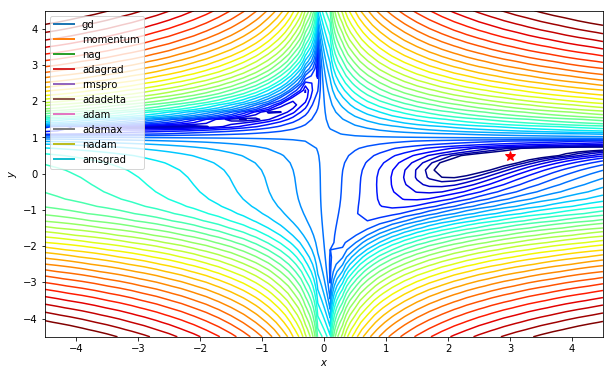

In [137]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.contour(x, y, z, levels=np.logspace(0, 5, 35), norm=LogNorm(), cmap=plt.cm.jet)
ax.plot(*minima_, 'r*', markersize=10)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')

ax.set_xlim((xmin, xmax))
ax.set_ylim((ymin, ymax))

anim = TrajectoryAnimation(*paths, labels=methods, ax=ax)

ax.legend(loc='upper left')

In [138]:
HTML(anim.to_jshtml())

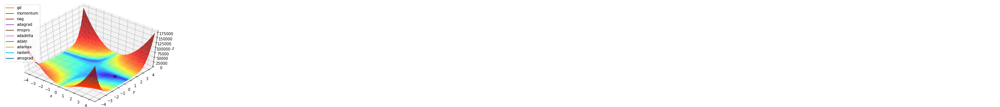

In [132]:
fig = plt.figure(figsize=(8, 5))
ax = plt.axes(projection='3d', elev=50, azim=-50)

ax.plot_surface(x, y, z, norm=LogNorm(), rstride=1, cstride=1, edgecolor='none', alpha=.8, cmap=plt.cm.jet)
ax.plot(*minima_, f(*minima_), 'r*', markersize=10)

ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')

ax.set_xlim((xmin, xmax))
ax.set_ylim((ymin, ymax))

zpaths = [f(*path) for path in paths]
anim = TrajectoryAnimation3D(*paths, zpaths=zpaths, labels=methods, ax=ax)

ax.legend(loc='upper left')

In [133]:
HTML(anim.to_jshtml())